## Prediction of Arctic Sea Ice Decline and Impact on Atmospheric Patterns

### Introduction 

The goal of this project is to use machine learning algorithms to study correlations between climate variables and sea ice in the Arctic Region and to determine their importance for sea ice prediction. Additionally, the relationship between the atmospheric circulation pattern of the Arctic Oscillation and sea ice fraction is being investigated.  

In [1]:
import xarray as xr
import pandas as pd 
import numpy as  np
import seaborn as sns
import tensorflow as tf
import matplotlib
from scipy.stats import linregress 
import matplotlib.pyplot as plt
import matplotlib.path as mpath
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.utils import shuffle
from sklearn.svm import SVR
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import MinMaxScaler
import eofs
import scipy.signal as sig
from eofs.xarray import Eof
import warnings
warnings.filterwarnings('ignore')

### Preprocess ERA5 Data

In [2]:
ds_ERA5 = xr.open_dataset('combined_era5_1981-2023.nc')

In [3]:
#single level
t2m = ds_ERA5['t2m'] #2m-air-temperature
siconc = ds_ERA5['siconc'] #sea ice concentration
sp = ds_ERA5['sp'] #surface pressure 
u10 = ds_ERA5['u10'] #10m u wind component
v10 = ds_ERA5['v10'] #10m v wind component 
tp = ds_ERA5['tp'] #total precipitation
sst = ds_ERA5['sst'] #sea surface temperature 
e = ds_ERA5['e'] #evaporation
slhf = ds_ERA5['slhf']#surface latent heat flux
sntr = ds_ERA5['sntr'] # surface net lw radiation
strc = ds_ERA5['strc'] #surface net lw radiation clear sky
sshf = ds_ERA5['sshf'] #surface sensible heat flux
tcc = ds_ERA5['tcc'] #total cloud cover


#at specific pressure levels
z_500 = ds_ERA5['z_500'] #geopotential height at 500 hPa
u_850 = ds_ERA5['u_850'] #u wind component at 850 hPa
v_850 = ds_ERA5['v_850'] #v wind component at 850 hPa
u_250 = ds_ERA5['u_250'] #u wind component at 250 hPa
v_250 = ds_ERA5['v_250'] #v wind component at 250 hPa
t_850 = ds_ERA5['t_850'] #temperature at 850 hPa
q_850 = ds_ERA5['q_850'] #specific humidity at 850 hPa
z_1000 = ds_ERA5['z_1000'] #geopotential height at 1000 hPa

In [4]:
# Define dictionary to store variables (could be more efficient)
variables = {
    't2m':t2m,
    'siconc':siconc,
    'sp': sp,
    'u10': u10,
    'v10': v10,
    'tp': tp,
    'sst': sst,
    'e':e,
    'slhf':slhf,
    'sshf':sshf,
    'tcc':tcc,
    'str':sntr,
    
    'z_500': z_500,
    'u_850': u_850,
    'v_850': v_850,
    'u_250': u_250,
    'v_250': v_250,
    't_850': t_850,
    'q_850': q_850
}

In [5]:
#Compute monthly climatology over baseline period 1981-2010 for each variable
def bl_comp(var): 
    return var.sel(time=slice('1981-01-01T00:00:00','2010-12-31T00:00:00')).groupby('time.month').mean(dim='time')

#Empty dict for baseline variables
bl_clim = {}

for var_name, var_data in variables.items():
    bl_clim[var_name + '_clim'] = bl_comp(var_data)
    


In [6]:
#Compute anomalies for all variables
anomalies = {}
for var_name, var_data in variables.items():
    clim_data = bl_clim[f'{var_name}_clim']
    
    anomaly = var_data.groupby('time.month') - clim_data

    anomalies[f'{var_name}_anomaly'] = anomaly

In [7]:
#Calculates area weights to consider the different grid box sizes

def area_weights(lat,lon): 
    #latitude has to be converted from degrees into rad 
    lat_rad = np.deg2rad(lat)

    #area of cells can be approximated considering lat and lon
    r_Earth = 6371
    lon_width = lon[1] - lon[0]
    area = (np.pi/180) *r_Earth**2 * np.cos(lat_rad) * lon_width

    weights = area/area.sum()

    return weights 
    


In [8]:
lat = ds_ERA5['latitude']
lon = ds_ERA5['longitude']

weights = area_weights(lat,lon)

In [9]:
#Dictionary for the 2D data
time_series_data = {}

#Calculate mean and save in dictionary first, then in a pandas dataframe to compute a correlation later
for var_name, anomaly_data in anomalies.items():

    spatial_mean = (anomaly_data).mean(dim=['latitude', 'longitude'])

    time_series_data[var_name] = pd.Series(spatial_mean.values, index=anomaly_data.time.values)
    
    #Pandas dataframe for the anomaly data
    ERA5_df = pd.DataFrame(time_series_data)



In [10]:
time_series_data2 = {}

# Calculate weighted mean and save in dictionary first, then in a pandas dataframe to compute a correlation later
for var_name, anomaly_data in anomalies.items():

    spatial_mean2 = (anomaly_data*weights).mean(dim=['latitude', 'longitude'])

    time_series_data2[var_name] = pd.Series(spatial_mean2.values, index=anomaly_data.time.values)

    ERA5_2_df = pd.DataFrame(time_series_data2)


### Exploratory Data Analysis

In [11]:
#Mean of Northern Hemisphere north of 50°N!

In [14]:
def plot_data_linreg(var,saveim=False):
    '''Function plots the anomalies of the variable over time (mean of the northern hemisphere) and a linear regression model'''
    # Linear Model scipy
    time = np.arange(len(anomalies[f'{var}_anomaly'].time))
    
    slope, intercept, r, p_value, std_err = linregress(time,anomalies[f'{var}_anomaly'].mean(dim=['longitude','latitude']))
    
    # Plot data and linear model
    plt.figure(figsize=[7,4])
    plt.plot(anomalies[f'{var}_anomaly'].time,(anomalies[f'{var}_anomaly']).mean(dim=['longitude','latitude']),label=f'Mean {var} Anomaly ({variables[var].units})',color='navy',linewidth = 0.8)
    plt.plot(anomalies[f'{var}_anomaly'].time,(slope*time+intercept),label=f'Linear Trend (R^2 = {r**2:.3f})',color='sandybrown',linewidth=1.2)
    plt.title(f'Mean {variables[var].long_name} anomaly ({variables[var].units}) ERA5 Reanalysis')
    
    plt.legend()
    if saveim==True: 
        title = variables[var].long_name
        plt.savefig(f'{title}.png',format='png',dpi=150)
    

    plt.show()

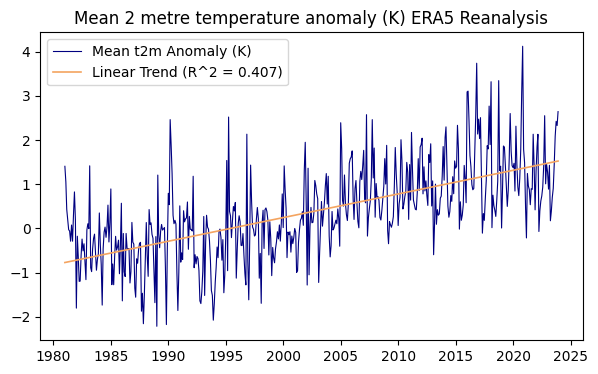

In [16]:
plot_data_linreg('t2m')

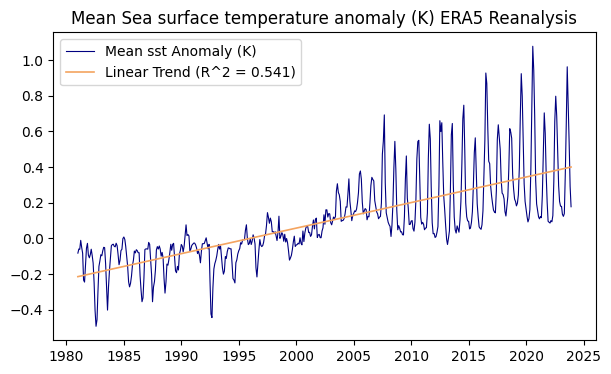

In [14]:
plot_data_linreg('sst')

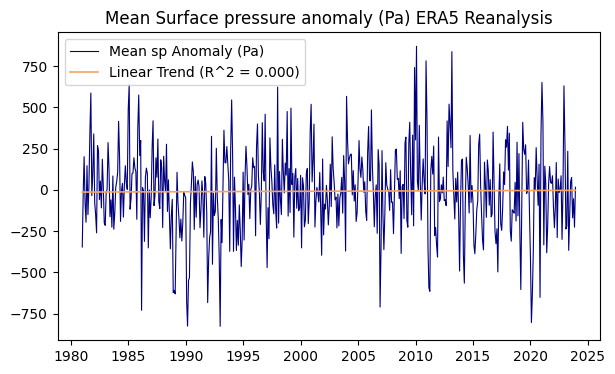

In [15]:
plot_data_linreg('sp')

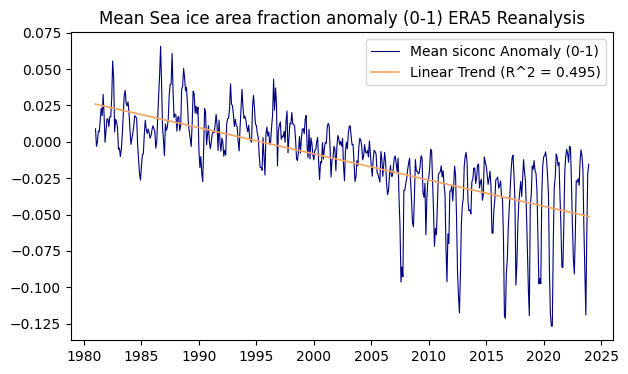

In [18]:
plot_data_linreg('siconc',saveim=True)

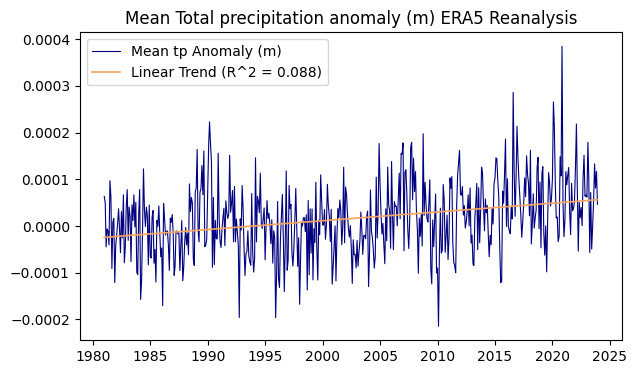

In [17]:
plot_data_linreg('tp')

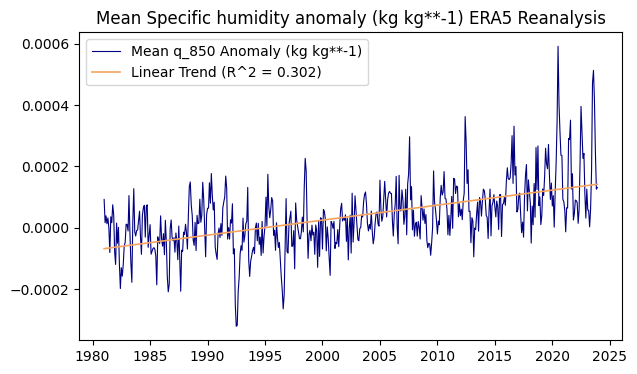

In [18]:
plot_data_linreg('q_850')

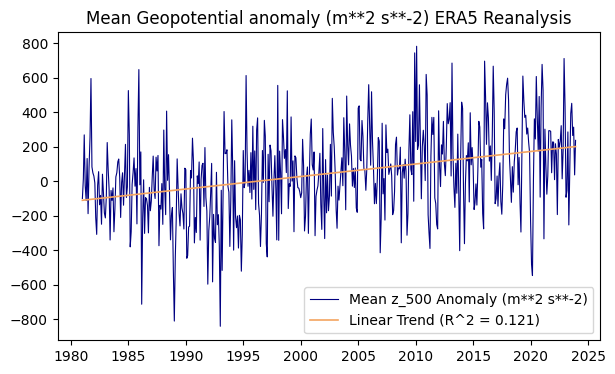

In [19]:
plot_data_linreg('z_500')

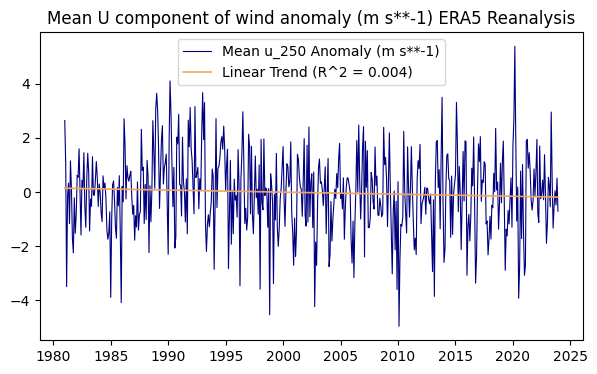

In [20]:
plot_data_linreg('u_250')

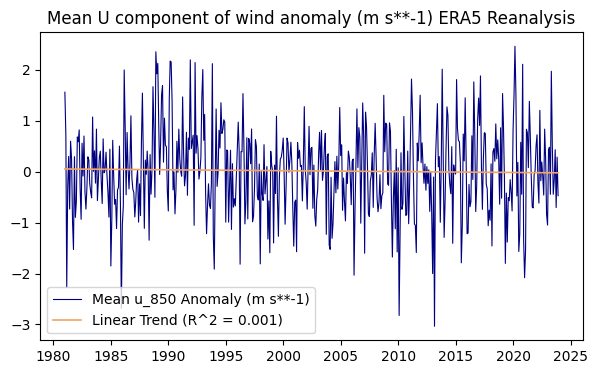

In [21]:
plot_data_linreg('u_850')

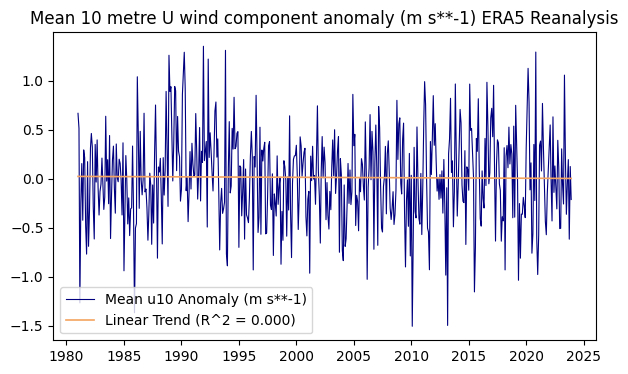

In [22]:
plot_data_linreg('u10')

In [23]:
# Scatter Plots

In [24]:
def scatter_data_trend(var1,var2):

    slope, intercept, r, p_value, std_err = linregress(anomalies[f'{var1}_anomaly'].mean(dim=['longitude','latitude']),anomalies[f'{var2}_anomaly'].mean(dim=['longitude','latitude']))
    
    
    plt.figure(figsize=[7,4])
    plt.scatter(anomalies[f'{var1}_anomaly'].mean(dim=['longitude','latitude']),anomalies[f'{var2}_anomaly'].mean(dim=['longitude','latitude']),edgecolors='navy',facecolors='none')
    plt.plot(anomalies[f'{var1}_anomaly'].mean(dim=['longitude','latitude']),(slope*anomalies[f'{var1}_anomaly'].mean(dim=['longitude','latitude'])+intercept),color='sandybrown',label=f'Linear Trend (R^2 = {r**2:.3f})')
    plt.xlabel(f'{var1} anomaly ({variables[var1].units})')
    plt.ylabel(f'{var2} anomaly ({variables[var2].units})')
    plt.legend()
    plt.title(f'Scatter Plot of {var1} and {var2} anomalies')

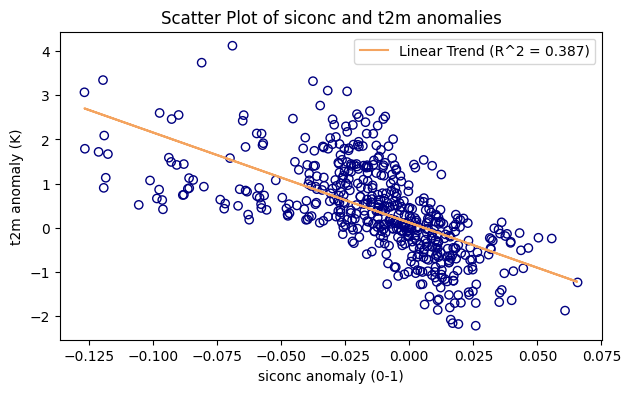

In [25]:
scatter_data_trend('siconc','t2m')

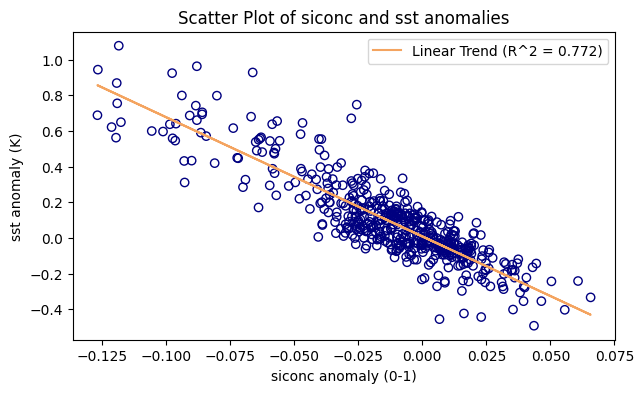

In [26]:
scatter_data_trend('siconc','sst')

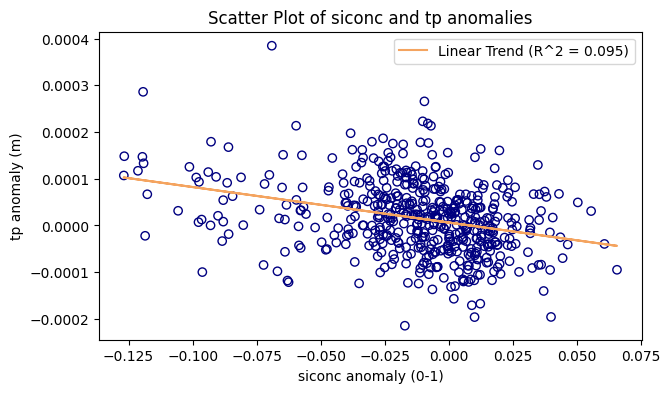

In [27]:
scatter_data_trend('siconc','tp')

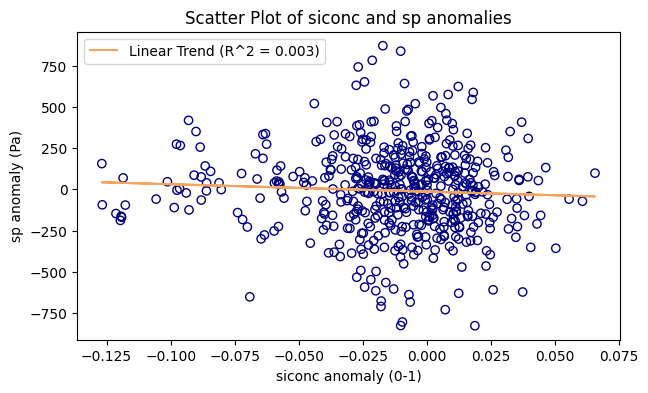

In [28]:
scatter_data_trend('siconc','sp')

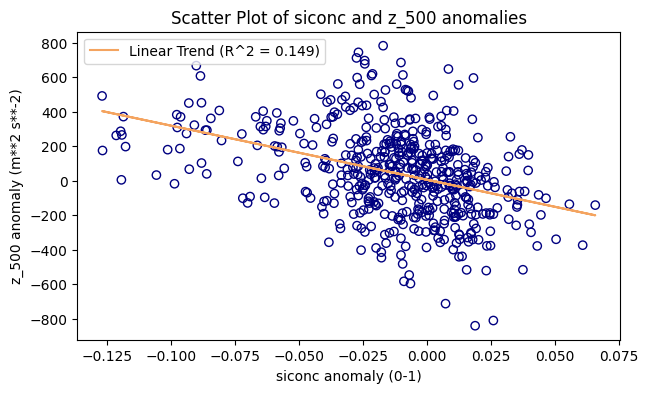

In [29]:
scatter_data_trend('siconc','z_500')

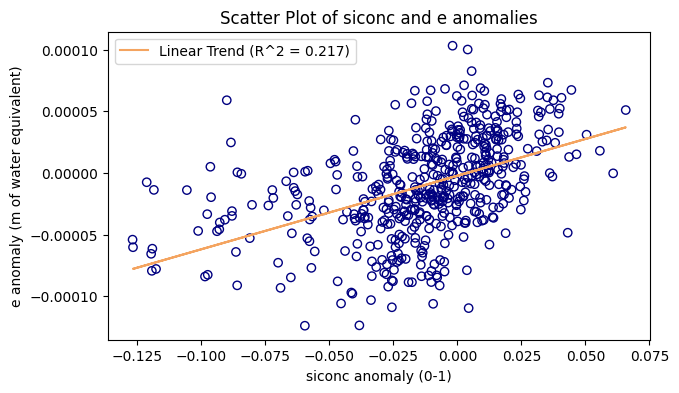

In [30]:
scatter_data_trend('siconc','e')

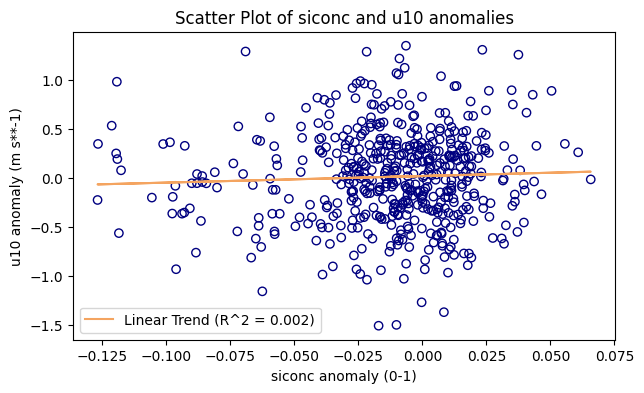

In [31]:
scatter_data_trend('siconc','u10')

Text(0.5, 1.0, 'Correlation Heatmap')

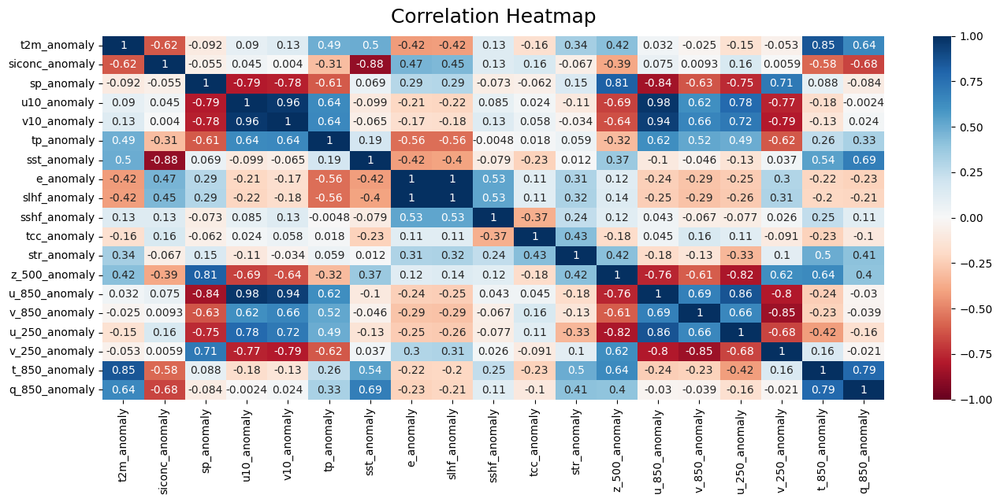

In [32]:
# Plot heatmap
plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(ERA5_df.corr(), vmin=-1, vmax=1, annot=True, cmap='RdBu')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12)
        

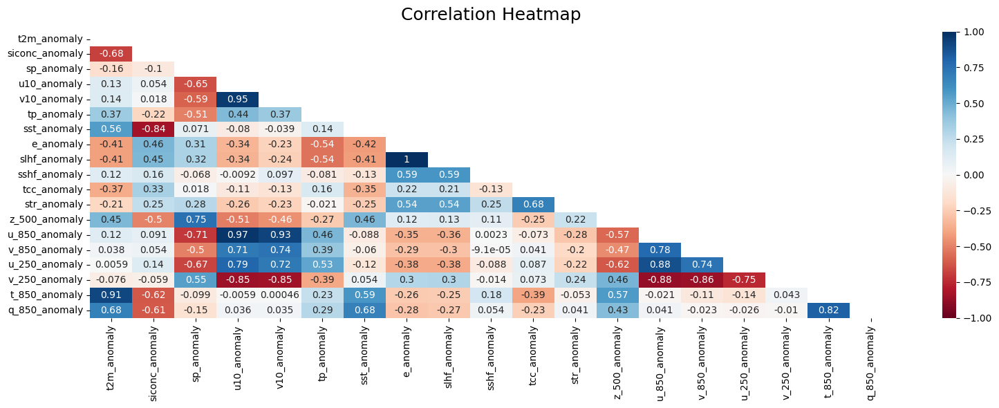

In [20]:
#Exploratory Data Analysis
#correlation heatmap for weighted data
plt.figure(figsize=(16, 6))
mask = np.triu(np.ones_like(ERA5_2_df.corr()))
heatmap = sns.heatmap(ERA5_2_df.corr(), vmin=-1, vmax=1, annot=True, mask=mask, cmap='RdBu')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12)
plt.tight_layout() #to save image
plt.savefig('Correlation_heatmap.png',format='png',dpi=150)
plt.show()

In [34]:
# Spatial correlation

In [35]:
#correlation between variables 
def plot_pearson_corr(var1,var2):

    #calculate yearly mean 
    var1_mean = var1.resample(time='YE').mean()
    var2_mean = var2.resample(time='YE').mean()
    
    #Pearson correlation coefficient
    correlation = xr.corr(var1_mean,var2_mean, dim='time')
    
    fig = plt.figure(figsize=(6,6))
    ax = plt.axes(projection=ccrs.NorthPolarStereo())
    
    ax.set_extent([-180,180,50,90],crs=ccrs.PlateCarree())
    
    #plot PCC on map 
    correlation.plot(ax=ax, transform=ccrs.PlateCarree(), cmap= 'RdBu',vmin=-1,vmax=1,cbar_kwargs={'label': 'PCC'})
    
    ax.coastlines()
    ax.gridlines()#draw_labels=True)

    #create circular image
    center, radius = [0.5, 0.5], 0.5
    circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)), np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
    ax.set_boundary(circle, transform = ax.transAxes)

    plt.title('')
    plt.show()


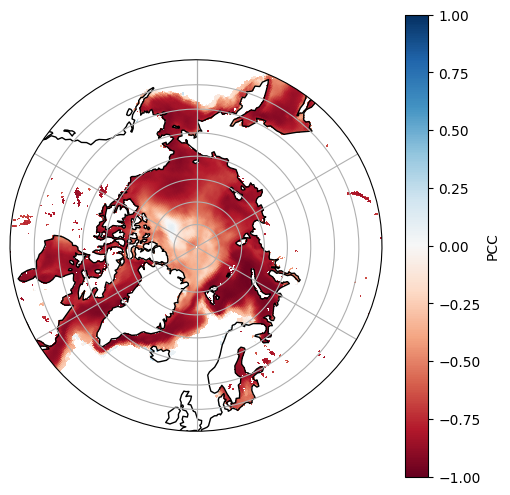

In [36]:
plot_pearson_corr(siconc,t2m)

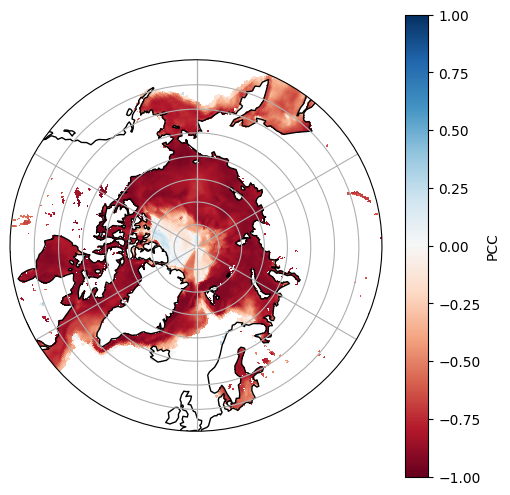

In [37]:
plot_pearson_corr(siconc,sst)

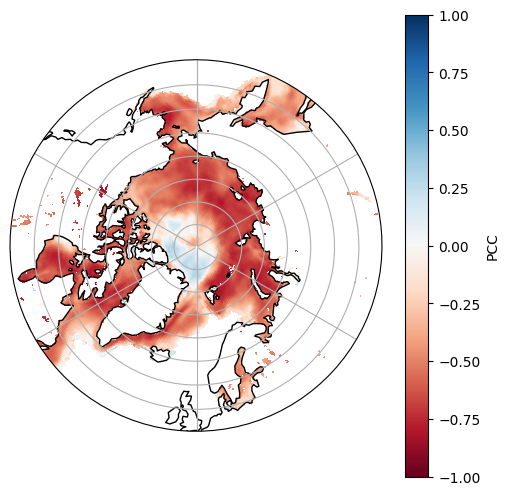

In [38]:
plot_pearson_corr(siconc,q_850)

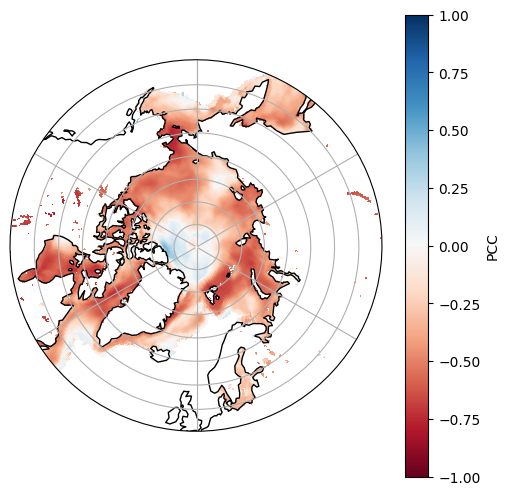

In [39]:
plot_pearson_corr(siconc,z_500)

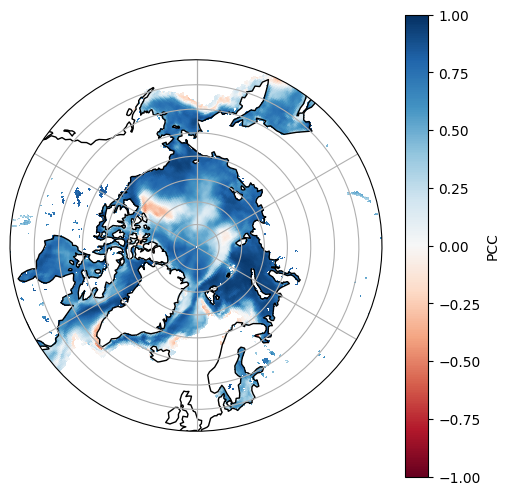

In [40]:
plot_pearson_corr(siconc,e)

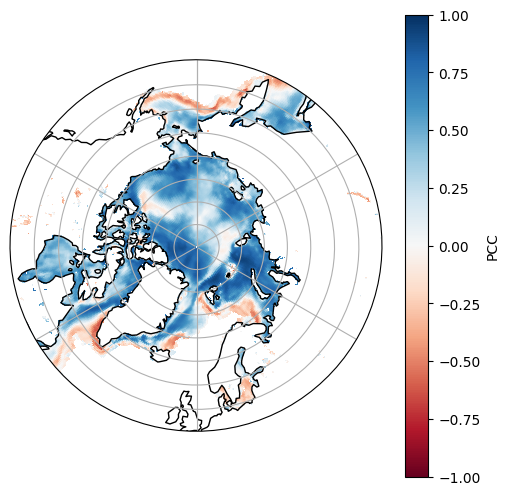

In [41]:
plot_pearson_corr(siconc,sshf)

In [42]:
def seasonal_subplots(var,cmap='coolwarm'):
    #group by seasons and create seasonal mean 
    var_seas = var.groupby('time.season').mean(dim='time') 
    seasons = ['DJF', 'MAM', 'JJA', 'SON']
    
    #create subplots 2x2 (circular with set_boundary) and set spacing
    fig,axs = plt.subplots(2,2,figsize=(12,8),subplot_kw={'projection': ccrs.NorthPolarStereo()})
    fig.suptitle(f'Seasonal {var.long_name} 1981-2023 Mean ERA5')
    plt.subplots_adjust(wspace=-0.5, hspace=0.4)
    
    for ax,season in zip(axs.flat,seasons):
        ax.set_extent([-180,180,50,90],crs=ccrs.PlateCarree())
        ax.coastlines()
        ax.gridlines()#draw_labels=True)
        center, radius = [0.5, 0.5], 0.5
        circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)), np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
        ax.set_boundary(circle, transform = ax.transAxes)

        #insert data, pcolormesh to get a smooth colorbar
        cs = ax.pcolormesh(var_seas['longitude'], var_seas['latitude'], var_seas.sel(season=season), transform=ccrs.PlateCarree(), cmap=cmap,shading='auto')
        
        ax.set_title(f'{season}')
        
    #add 1 colorbar for all plots 
    cbar = fig.colorbar(cs, ax=axs, orientation='horizontal', fraction=0.05, pad=0.1,extend = 'both')
    cbar.set_label(f'{var.long_name} ({var.units})')
    
    plt.show()


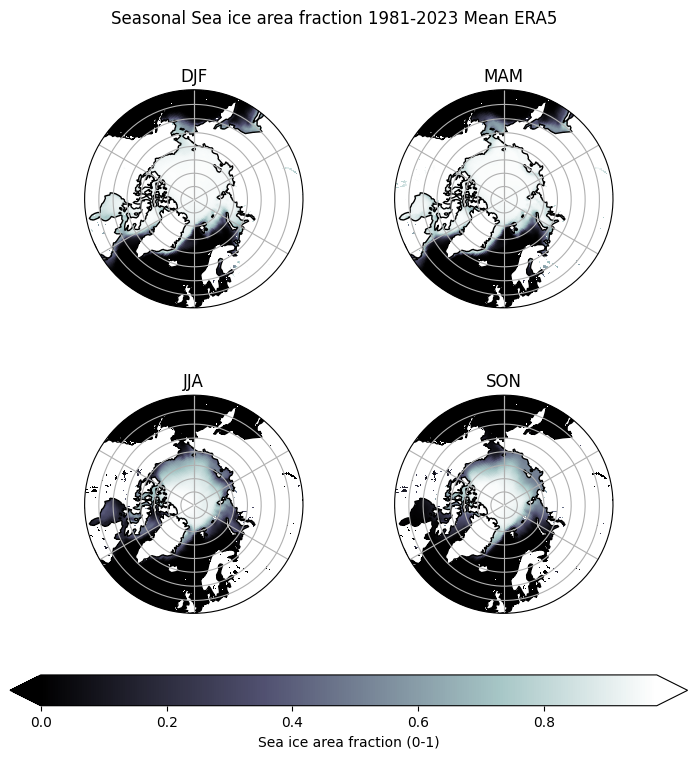

In [43]:
seasonal_subplots(siconc,'bone')

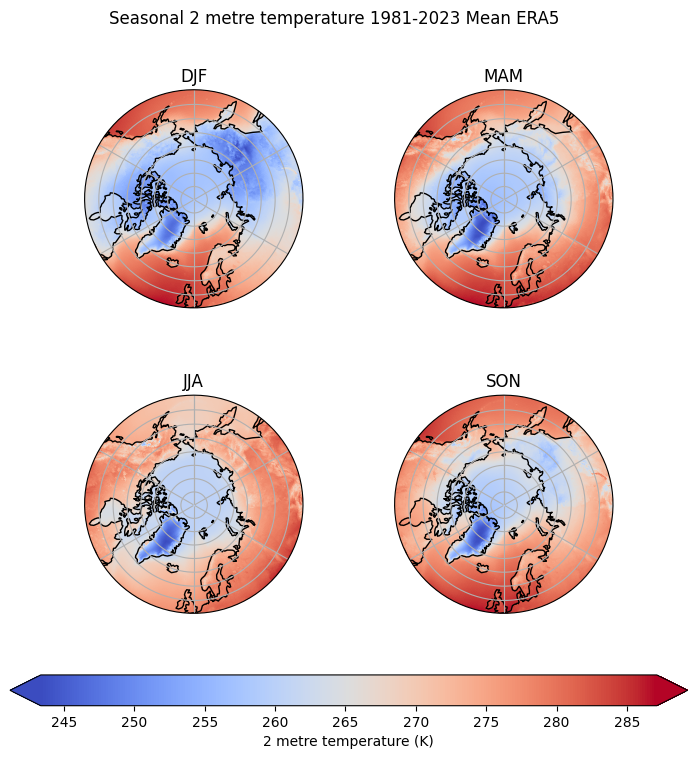

In [44]:
seasonal_subplots(t2m)

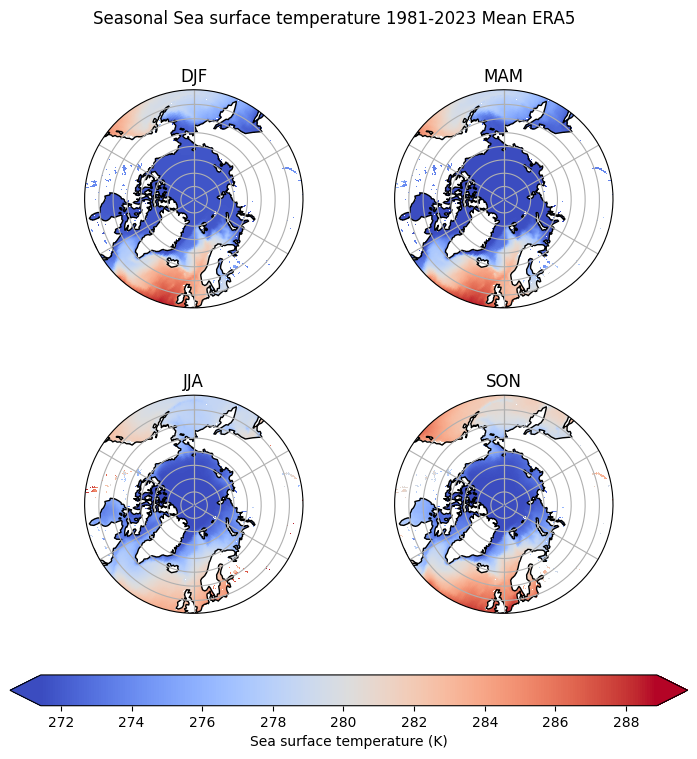

In [45]:
seasonal_subplots(sst)

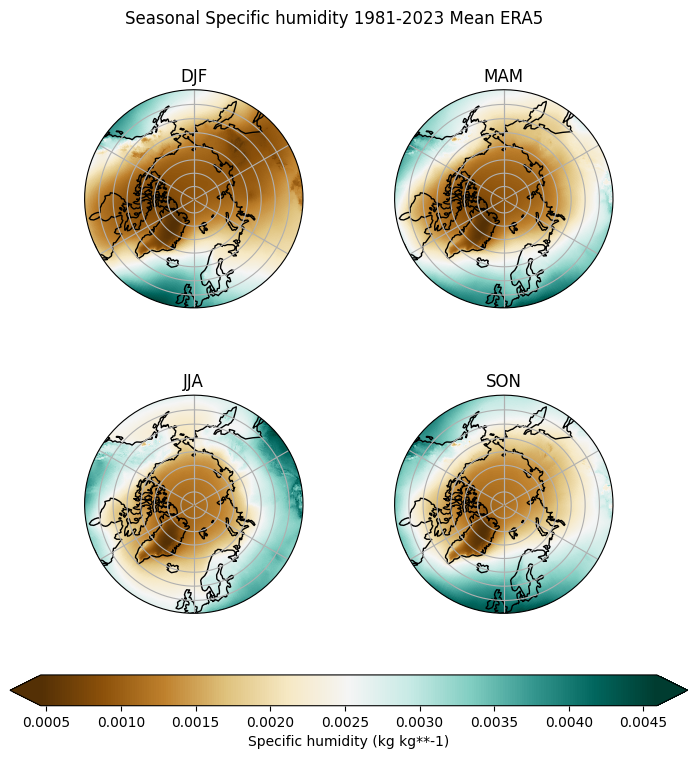

In [46]:
seasonal_subplots(q_850,'BrBG')

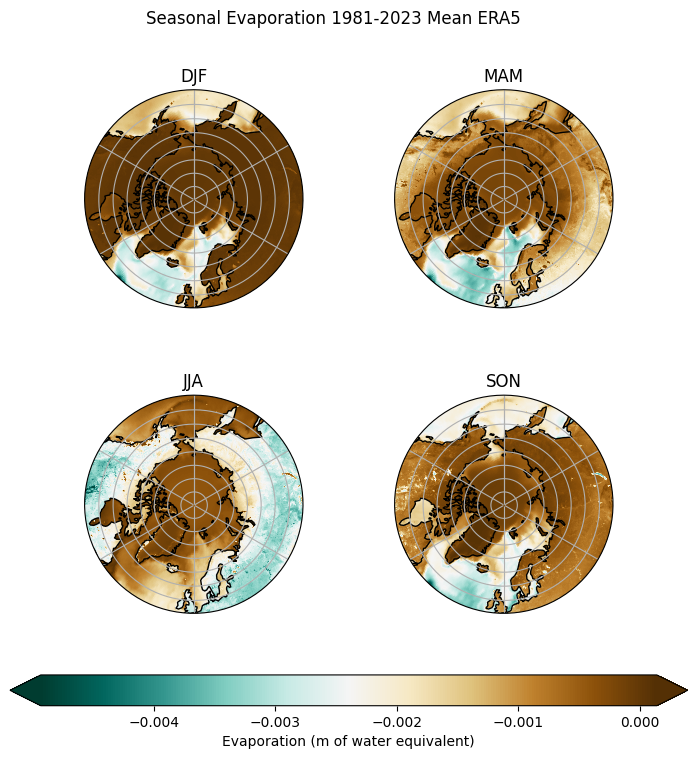

In [47]:
seasonal_subplots(e,'BrBG_r')

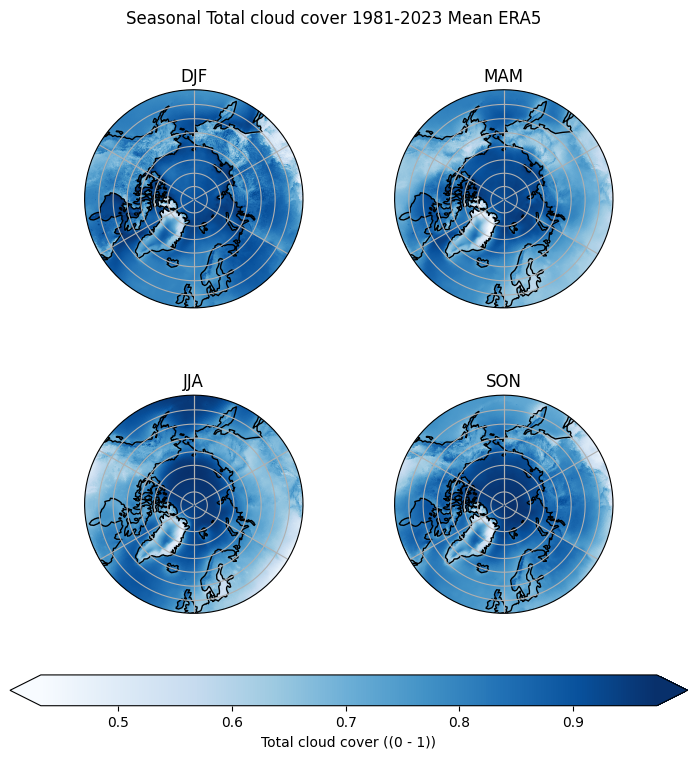

In [48]:
seasonal_subplots(tcc,'Blues')

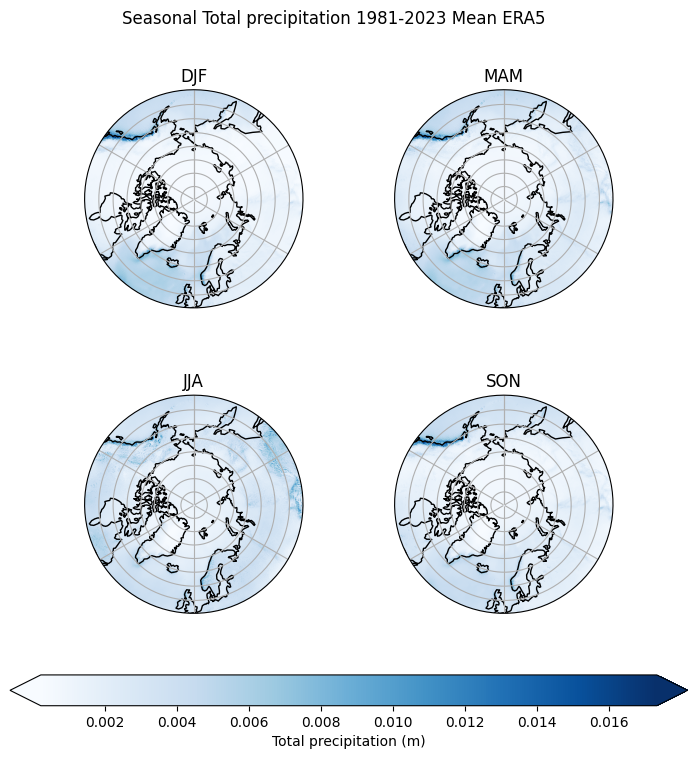

In [49]:
seasonal_subplots(tp,'Blues')

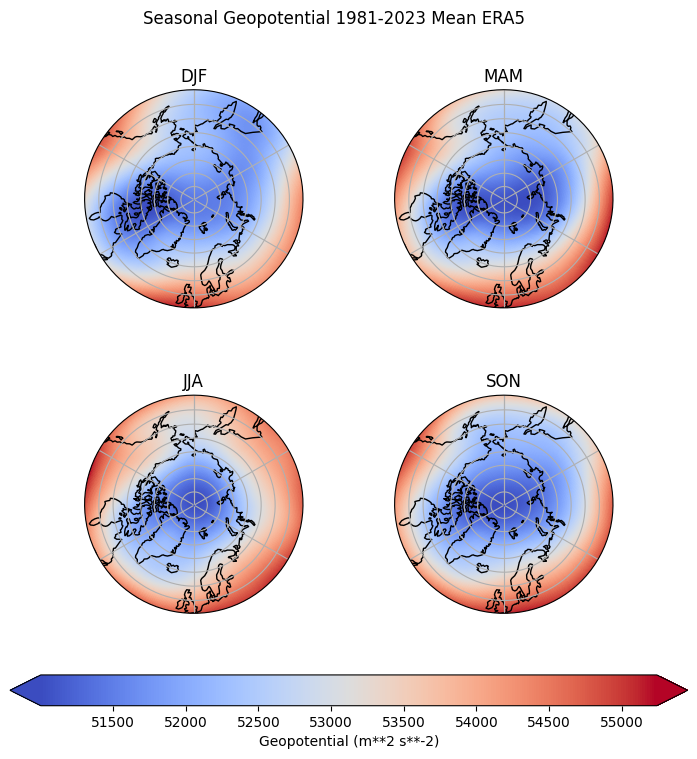

In [50]:
seasonal_subplots(z_500)

In [23]:
def seasonal_PCC(var1,var2,saveim=False):
    
    #create groups for each season 
    var_1 = var1.groupby('time.season')
    var_2 = var2.groupby('time.season')
    seasons = ['DJF', 'MAM', 'JJA', 'SON']

    #create subplots and title, setup spacing between subplots, select area, add coastlines and gridlines 
    fig,axs = plt.subplots(2,2,figsize=(12,8),subplot_kw={'projection': ccrs.NorthPolarStereo()})
    fig.suptitle(f'Seasonal Correlation between {var1.long_name} and {var2.long_name}')
    plt.subplots_adjust(wspace=-0.5, hspace=0.3)
    
    for ax,season in zip(axs.flat,seasons):
        ax.set_extent([-180,180,50,90],crs=ccrs.PlateCarree())
        ax.coastlines()
        ax.gridlines()#draw_labels=True)
        center, radius = [0.5, 0.5], 0.5
        circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)), np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
        ax.set_boundary(circle, transform = ax.transAxes)
       
        # compute PCC between 2 variables
        correlation = xr.corr(var_1[season],var_2[season], dim='time')
        cplot = correlation.plot(ax=ax, transform=ccrs.PlateCarree(), cmap= 'RdBu',extend = 'both',vmin=-1,vmax=1,add_colorbar=False)
        ax.set_title(f'{season}')
        
    #add one colorbar for all subplots
    cbar = fig.colorbar(cplot, ax=axs, orientation='horizontal', fraction=0.05, pad=0.1,extend = 'both')
    cbar.set_label('PCC')

    #plt.tight_layout() #to save image

    if saveim: 
        
        plt.savefig(f'{var1.long_name}_and_{var2.long_name}.png',format='png',dpi=150)
    
    plt.show()


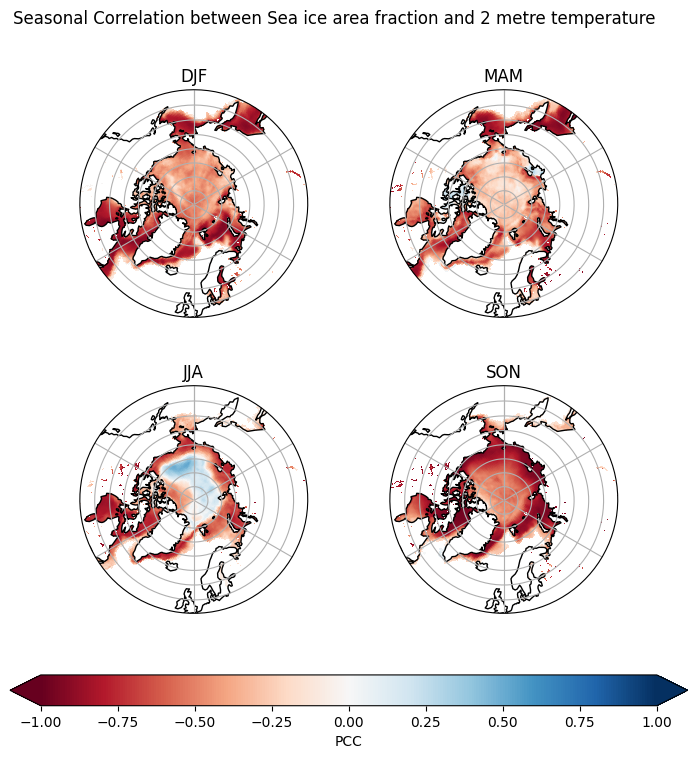

In [24]:
seasonal_PCC(siconc,t2m,saveim=True)

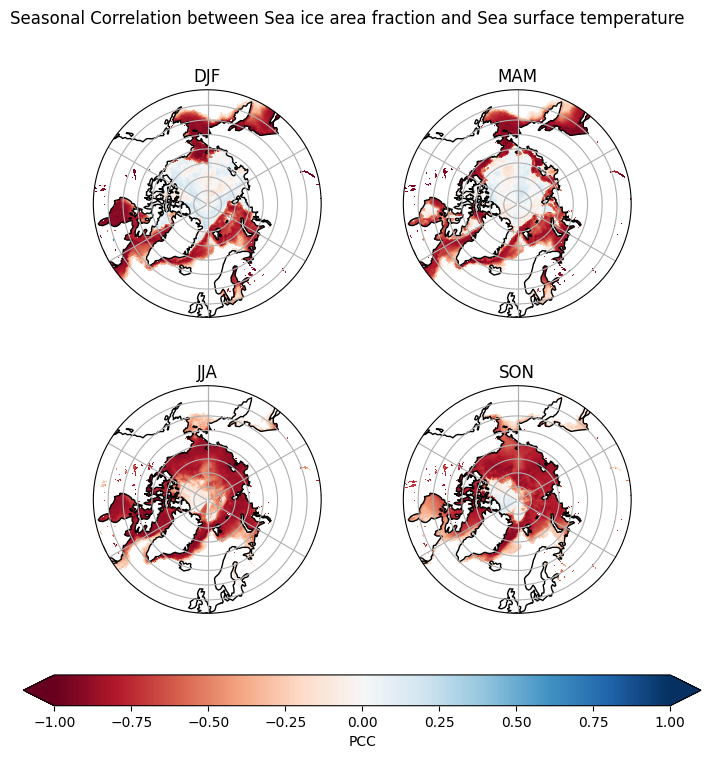

In [25]:
seasonal_PCC(siconc,sst,saveim=True)

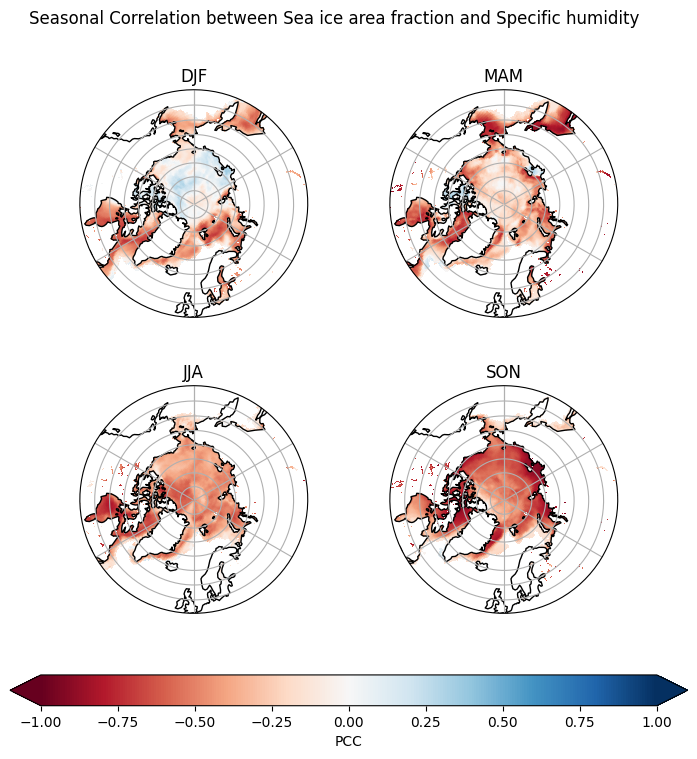

In [54]:
seasonal_PCC(siconc,q_850)

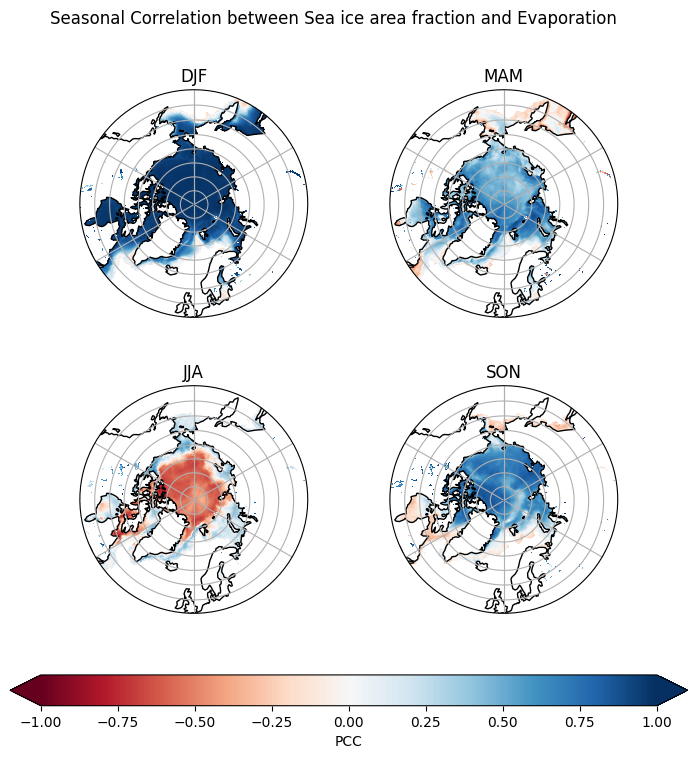

In [71]:
seasonal_PCC(siconc,e,saveim=True)
#large e means low evaporation!

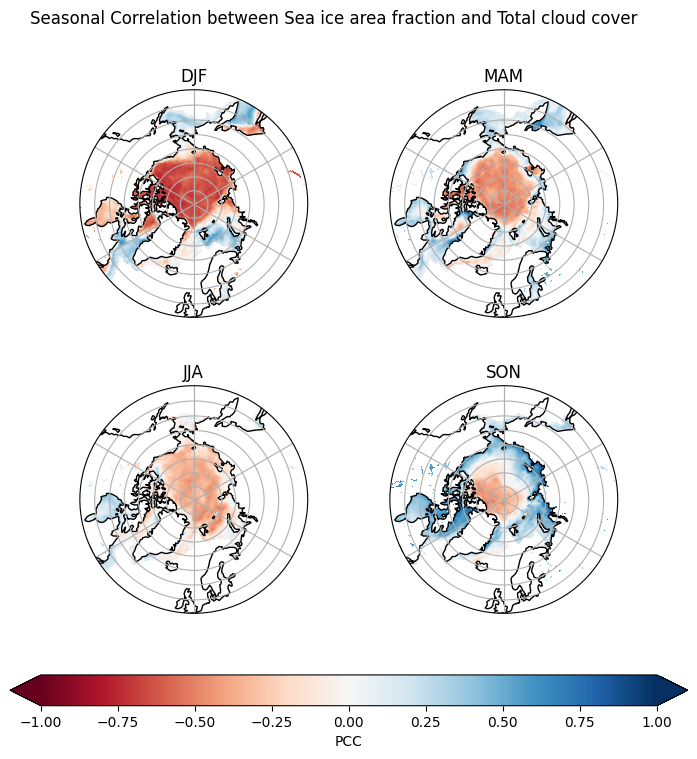

In [56]:
seasonal_PCC(siconc,tcc)

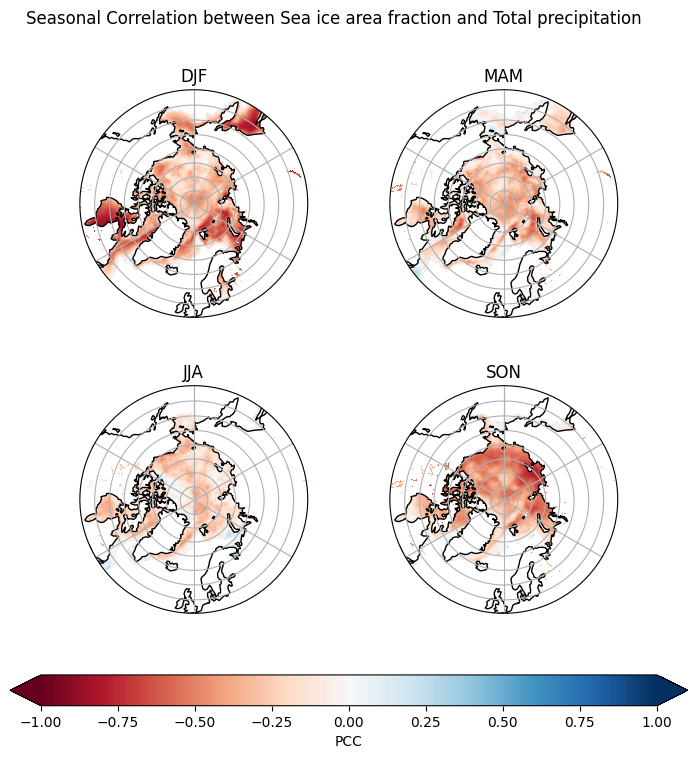

In [57]:
seasonal_PCC(siconc,tp)

### Machine Learning Analysis

#### Set up functions for Random Forest Analysis

In [28]:
#Predict sea ice concentration from ERA5 climate variables with Random Forest Regressor 
#scikit RF: https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html

def preprocess_data(): 
    '''Resamples variables, removes nan values, flattens arrays into 2D and 1D arrays
        returns: X and Y'''
    
    #Select feature variables and compute yearly mean to reduce sample size
    features = [t2m, sst, e, tp, z_500, q_850, tcc, siconc]
    resampled_means = [fts.resample(time='Y').mean() for fts in features]
    t2m_mean, sst_mean, e_mean, tp_mean, z_500_mean, q_850_mean, tcc_mean, siconc_mean = resampled_means

    #Combine features in np.array
    X = np.stack([t2m_mean.values, sst_mean.values, e_mean.values,tp_mean.values,z_500_mean.values,q_850_mean.values,tcc_mean.values], axis=-1)
    
    #Target variable sea ice 
    Y = siconc_mean.values
    
    #Create an ocean mask to prevent nan values -> we're interested in ocean area only anyways when working with sea ice 
    ocean_mask = ~np.isnan(sst_mean.values) 
    
    #set land data points as nan for feature variables 
    variables = [t2m_mean, sst_mean, e_mean,tp_mean,z_500_mean,q_850_mean,tcc_mean]
    masked_variables = []
    for var in variables:
        masked_var = np.where(ocean_mask, var.values, np.nan)
        masked_variables.append(masked_var)
    
    
    X = np.stack(masked_variables, axis=-1)
    Y = np.where(ocean_mask, siconc_mean.values, np.nan)
    
    #Check for missing values
    print("NaN values in X:", np.isnan(X).sum()," NaN values in Y: ", np.isnan(Y).sum())
    
    #Flatten the time, lat and lon dimensions into a single sample dimension, needed for splitting dataset 
    n_samples = X.shape[0] 
    n_lat = X.shape[1] 
    n_lon = X.shape[2]
    n_features = X.shape[3]
    
    #Reshape X into 2D array
    X = X.reshape(n_samples * n_lat * n_lon, n_features)
    
    #Reshape Y into 1D array
    Y = Y.reshape(n_samples * n_lat * n_lon)
    
    #Remove NaN values with mask -> should be possible to be done earlier somehow?
    not_nan = ~np.isnan(Y) & ~np.isnan(X).any(axis=1)
    X = X[not_nan]
    Y = Y[not_nan]

    #Check for missing values
    print("NaN values in X:", np.isnan(X).sum()," NaN values in Y: ", np.isnan(Y).sum())
    return X,Y

In [29]:
def split(X,Y):
    #Split dataset into testing and training data, test_size=0.2 is a common split (Pareto) and random_state=42 is also common ^^ 
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
    
    #Check shape of X and Y
    print(f'X_train shape: {X_train.shape} Y_train shape: {Y_train.shape}')
    print(f'X_test shape: {X_test.shape} Y_test shape: {Y_test.shape}')
    return X_train, X_test, Y_train, Y_test

In [30]:
def subset_train_test(X_train, Y_train): 
    #Dataset is very large and to reduce computing time, only a random subset is used to train the model -> shuffle and subset 
    
    X_train, Y_train = shuffle(X_train, Y_train, random_state=42)
    n_samples = int(0.1 * X_train.shape[0]) #here 10% of data
    
    X_train_sampled = X_train[:n_samples]
    Y_train_sampled = Y_train[:n_samples]
    
    #Check the shape to see if the size has been reduced successfully 
    print(f'X_train_sampled shape: {X_train_sampled.shape}')
    print(f'Y_train_sampled shape: {Y_train_sampled.shape}')
    
    return X_train_sampled, Y_train_sampled

In [31]:
def random_forest(X_train_sampled, Y_train_sampled, X_test, Y_test): 
    #Create and train the Random Forest model on the training data 
    model = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
    model.fit(X_train_sampled, Y_train_sampled)
    
    #Predict sea ice concentration using the model 
    Y_pred = model.predict(X_test)
    #Model evaluation 
    mae = mean_absolute_error(Y_test, Y_pred)
    rmse = np.sqrt(mean_squared_error(Y_test, Y_pred))
    r2 = r2_score(Y_test, Y_pred)
    
    print(f'Root Mean Squared Error: {rmse:.3f}')
    print(f'R^2 Score: {r2:.3f}')
    print(f'Mean Absolute Error: {mae:.3f}')

    #Check the importance of each feature in the prediction of the target variable (siconc)

    importances = model.feature_importances_
    feature_names = ['t2m', 'sst', 'e','tp','z_500','q_850','tcc']
    
    for name, importance in zip(feature_names, importances):
        print(f'Feature: {name}, Importance: {importance:.4f}')
    
    return model, importances, feature_names,Y_pred

In [32]:
def plot_rf_results(feature_names,importances,Y_test,Y_pred): 
    #Plot feature importance
    plt.figure(figsize=(10, 6))
    plt.barh(feature_names, importances, color='navy')
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.title('Random Forest Feature Importance')

    plt.show()

    
    
    #Plot performance of predicted siconc values vs actual siconc 
    plt.figure(figsize=(10, 6))
    plt.scatter(Y_test, Y_pred, edgecolor='k',facecolors='navy',alpha=0.2)
    plt.plot([Y_test.min(), Y_test.max()], [Y_test.min(), Y_test.max()], c='sandybrown',linestyle='--')
    plt.xlabel('Actual Sea Ice Concentration')
    plt.ylabel('Predicted Sea Ice Concentration')
    plt.title('Actual vs. Predicted Sea Ice Concentration')
    plt.savefig('actualvspredicted.png',format='png',dpi=150)
    plt.show()


In [33]:
def cross_validation(model,X_train_sampled, Y_train_sampled): 
    #Do a cross validation of the RF model (5-fold) to see if the model performance is robust 
    cv_scores = cross_val_score(model, X_train_sampled, Y_train_sampled, cv=5, scoring='r2')
    #CV results 
    print(f'Cross-Validation Scores: {cv_scores}')
    print(f'Mean Cross-Validation Score: {cv_scores.mean():.3f}')
    print(f'Standard Deviation of Cross-Validation Scores: {cv_scores.std():.5f}')

#### Conduct Analysis 

In [34]:
#Preprocess climate variables 
X,Y = preprocess_data()

NaN values in X: 28242228  NaN values in Y:  4034604
NaN values in X: 0  NaN values in Y:  0


In [35]:
#Split data into testing and training set
X_train, X_test, Y_train, Y_test = split(X,Y)

X_train shape: (4747612, 7) Y_train shape: (4747612,)
X_test shape: (1186904, 7) Y_test shape: (1186904,)


In [36]:
#Reduce sample size
X_train_sampled, Y_train_sampled = subset_train_test(X_train, Y_train)

X_train_sampled shape: (474761, 7)
Y_train_sampled shape: (474761,)


In [37]:
#Train the RF model and compute prediction 
model, importances, feature_names,Y_pred = random_forest(X_train_sampled, Y_train_sampled, X_test, Y_test)

python(2620) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Root Mean Squared Error: 0.020
R^2 Score: 0.998
Mean Absolute Error: 0.009
Feature: t2m, Importance: 0.8772
Feature: sst, Importance: 0.0795
Feature: e, Importance: 0.0366
Feature: tp, Importance: 0.0014
Feature: z_500, Importance: 0.0022
Feature: q_850, Importance: 0.0017
Feature: tcc, Importance: 0.0013


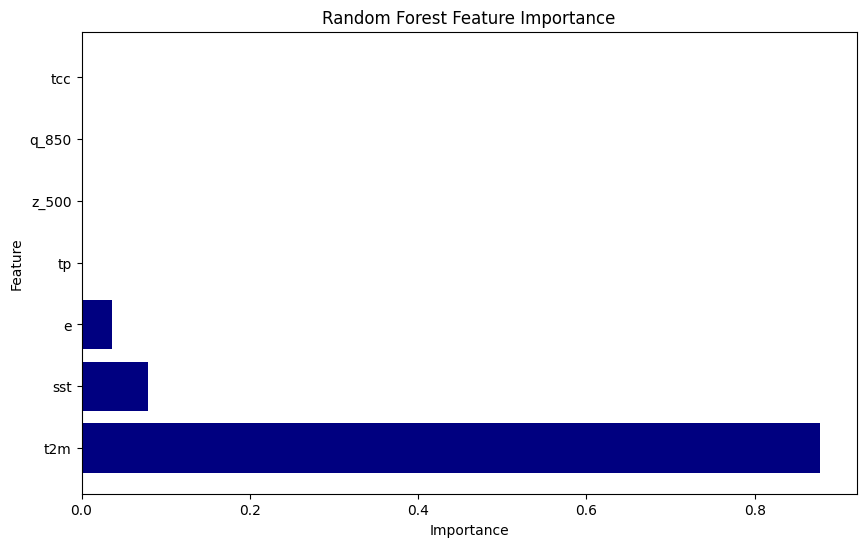

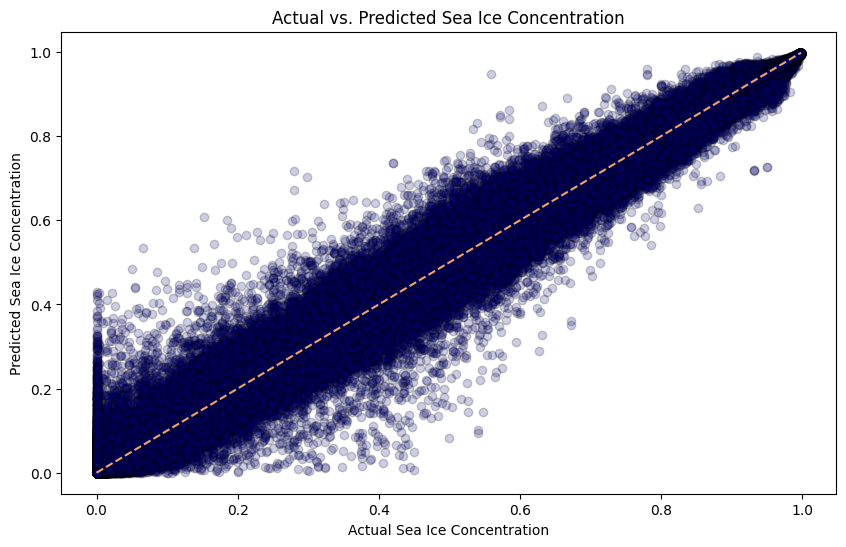

In [38]:
#Plot Feature importance and prediction vs actual data
plot_rf_results(feature_names,importances,Y_test,Y_pred)

In [69]:
#Cross validation
cross_validation(model,X_train_sampled, Y_train_sampled)

Cross-Validation Scores: [0.99733321 0.99735082 0.99733277 0.99732968 0.99735702]
Mean Cross-Validation Score: 0.997
Standard Deviation of Cross-Validation Scores: 0.00001


#### Comparison Analysis with reduced grid size 

In [39]:
#Select the same features but only values north of the arctic circle since we're focusing on sea ice 
features = [t2m, sst, e, tp, z_500, q_850, tcc, siconc]
resampled_means = [fts.sel(latitude=slice(90,66)).resample(time='Y').mean() for fts in features]
t2m_mean, sst_mean, e_mean, tp_mean, z_500_mean, q_850_mean, tcc_mean, siconc_mean = resampled_means
#Combine features in np.array
X = np.stack([t2m_mean.values, sst_mean.values, e_mean.values,tp_mean.values,z_500_mean.values,q_850_mean.values,tcc_mean.values], axis=-1)

#Target variable sea ice 
Y = siconc_mean.values

#Create an ocean mask to prevent nan values -> we're interested in ocean area only anyways when working with sea ice 
ocean_mask = ~np.isnan(sst_mean.values) 

#set land data points as nan for feature variables 
variables_rf = [t2m_mean, sst_mean, e_mean,tp_mean,z_500_mean,q_850_mean,tcc_mean]
masked_variables = []
for var in variables_rf:
    masked_var = np.where(ocean_mask, var.values, np.nan)
    masked_variables.append(masked_var)


X = np.stack(masked_variables, axis=-1)
Y = np.where(ocean_mask, siconc_mean.values, np.nan)

#Check for missing values
print("NaN values in X:", np.isnan(X).sum()," NaN values in Y: ", np.isnan(Y).sum())

#Flatten the time, lat and lon dimensions into a single sample dimension, needed for splitting dataset 
n_samples = X.shape[0] 
n_lat = X.shape[1] 
n_lon = X.shape[2]
n_features = X.shape[3]

#Reshape X into 2D array
X = X.reshape(n_samples * n_lat * n_lon, n_features)

#Reshape Y into 1D array
Y = Y.reshape(n_samples * n_lat * n_lon)

#Remove NaN values with mask -> should be possible to be done earlier somehow?
not_nan = ~np.isnan(Y) & ~np.isnan(X).any(axis=1)
X = X[not_nan]
Y = Y[not_nan]

#Check for missing values
print("NaN values in X:", np.isnan(X).sum()," NaN values in Y: ", np.isnan(Y).sum())

NaN values in X: 11202317  NaN values in Y:  1600331
NaN values in X: 0  NaN values in Y:  0


In [40]:
#Split data into testing and training set
X_train, X_test, Y_train, Y_test = split(X,Y)


X_train shape: (3524727, 7) Y_train shape: (3524727,)
X_test shape: (881182, 7) Y_test shape: (881182,)


In [41]:
#Reduce sample size
X_train_sampled, Y_train_sampled = subset_train_test(X_train, Y_train)

X_train_sampled shape: (352472, 7)
Y_train_sampled shape: (352472,)


In [42]:
#Train the RF model and compute prediction 
model, importances, feature_names,Y_pred = random_forest(X_train_sampled, Y_train_sampled, X_test, Y_test)

Root Mean Squared Error: 0.018
R^2 Score: 0.996
Mean Absolute Error: 0.009
Feature: t2m, Importance: 0.7924
Feature: sst, Importance: 0.1518
Feature: e, Importance: 0.0490
Feature: tp, Importance: 0.0014
Feature: z_500, Importance: 0.0017
Feature: q_850, Importance: 0.0018
Feature: tcc, Importance: 0.0018


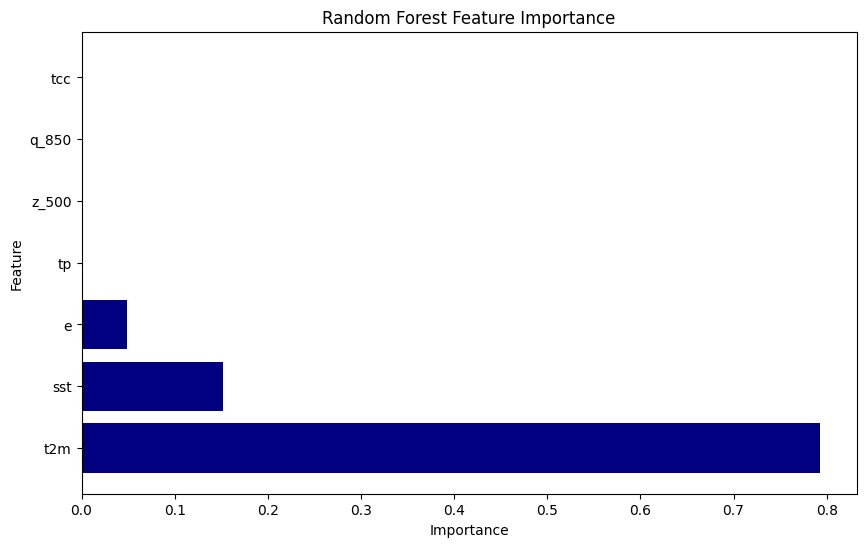

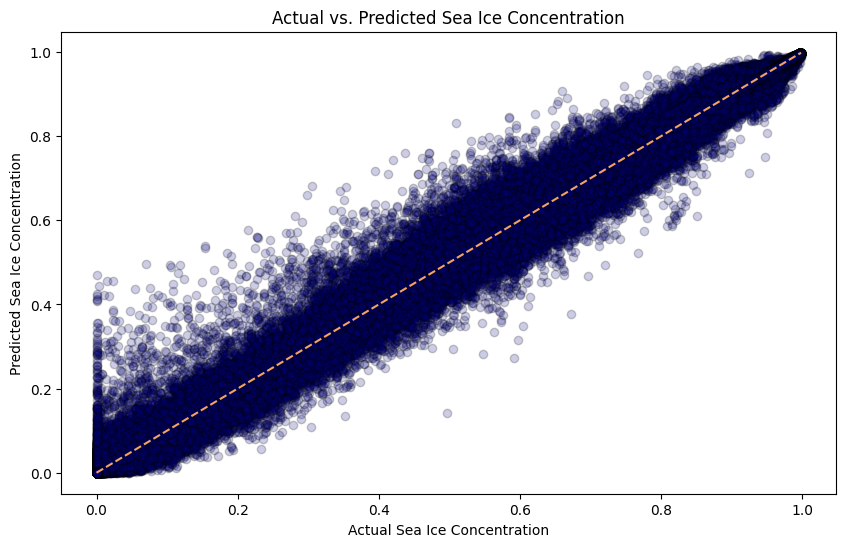

In [43]:
#Plot Feature importance and prediction vs actual data
plot_rf_results(feature_names,importances,Y_test,Y_pred)

In [75]:
#Cross validation
cross_validation(model,X_train_sampled, Y_train_sampled)

Cross-Validation Scores: [0.99595014 0.99587714 0.99595394 0.99594786 0.99567357]
Mean Cross-Validation Score: 0.996
Standard Deviation of Cross-Validation Scores: 0.00011


#### ARIMA Timeseries prediction

In [76]:
#https://skforecast.org/0.12.1/user_guides/forecasting-sarimax-arima

In [73]:
def plot_timeseries(ds,var): 
    
    variable = ds[var]
    var_mean = variable.mean(dim=['latitude', 'longitude'])
    time = var_mean.time
    var_values = var_mean.values
    
    #Plot siconc timeseries
    plt.figure(figsize=(14, 5))
    plt.plot(time, var_values, label=f'{variable.name}',color='navy')
    plt.xlabel('Time')
    plt.ylabel(f'{variable.long_name} ({variable.units})')
    plt.title(f'Mean {variable.long_name} Over Time')
    plt.show()
    return time, var_values 

In [77]:
def sarima(var_values, time, p=1, d=1, q=1,P=1,D=1,Q=1,s=12,method='bfgs'):
    #Split dataset into training and test sets 80% training data
    train_size = int(len(var_values) * 0.8)
    train, test = var_values[:train_size], var_values[train_size:]
    train_time,test_time = time[:train_size], time[train_size:]
    
    #ARIMA Model -> SARIMAX since we have seasonal data 
    p, d, q = p, d, q  #Default values, optimal values could still be determined 
    P, D, Q, s = P, D, Q, s  # Seasonal parameters; s=12 for months
    
    #train model 
    model = SARIMAX(train, order=(p, d, q),seasonal_order=(P,D,Q,s))
    model_fit = model.fit(method=method)
    
    #Forecast future values
    forecast = model_fit.forecast(steps=len(test))

    #Summary of model results 
    model_fit.summary()
    
    return test, train, forecast, test_time, train_time

In [78]:
def plot_forecast(train_time, train, test_time, test, forecast,var):
    #Plot actual values against forecasted values
    
    plt.figure(figsize=(14, 5))
    plt.plot(train_time,train, label='Training Data',color='navy')
    plt.plot(test_time,test, label='Test Data',color='sandybrown')
    plt.plot(test_time,forecast, label='Forecast', color='red')
    plt.title('ARIMA Forecast')
    plt.xlabel('Time')
    plt.ylabel(f'{var.long_name} ({var.units})')
    plt.legend()
    plt.savefig('ARIMA.png',format='png',dpi=150)
    plt.show()
    
    # Evaluate the model
    mse = mean_squared_error(test, forecast)
    print(f'Mean Squared Error: {mse:.5f}')

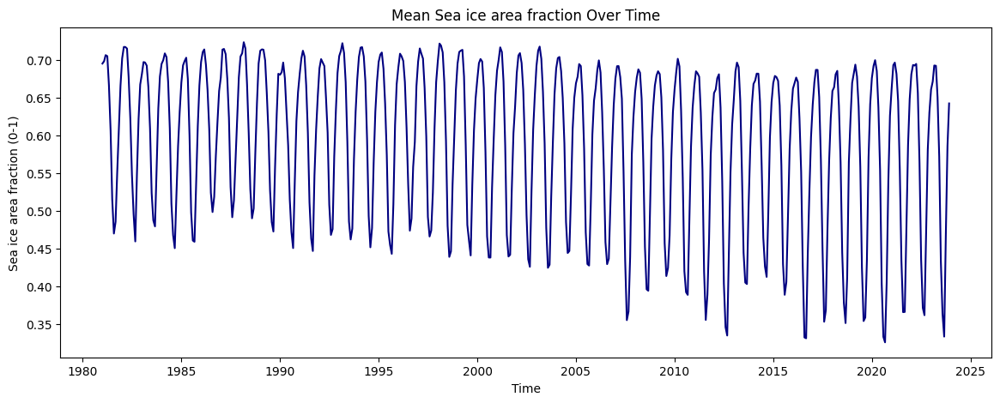

In [79]:
time, var_values = plot_timeseries(ds_ERA5,'siconc')


In [80]:
test, train, forecast, test_time, train_time = sarima(var_values, time)


Optimization terminated successfully.
         Current function value: -2.945660
         Iterations: 25
         Function evaluations: 33
         Gradient evaluations: 33


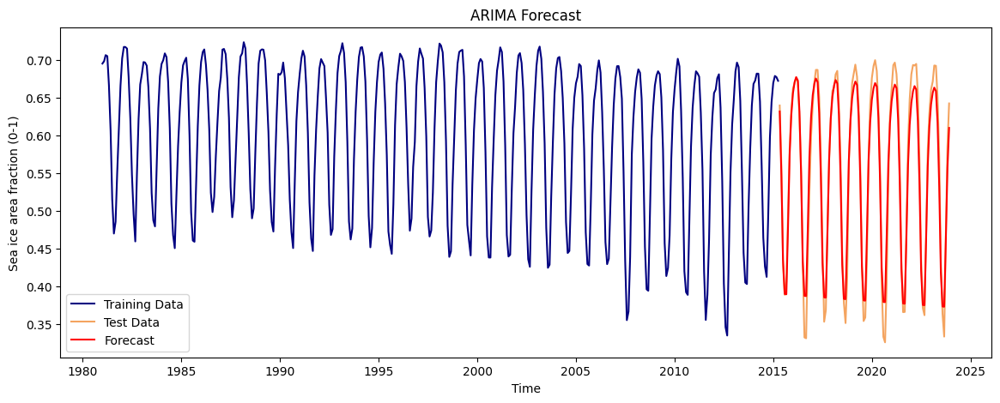

Mean Squared Error: 0.00058


In [81]:
plot_forecast(train_time, train, test_time, test, forecast,siconc)

#### LSTM Timeseries Prediction Recurrent Neural Network 

In [83]:
# https://www.tensorflow.org/tutorials/structured_data/time_series
# https://machinelearningmastery.com/time-series-prediction-lstm-recurrent-neural-networks-python-keras/

In [50]:
#Now we're using a Recurrent Neural Network with the name Long Short-Term Memory (LSTM) to predict the sea-ice fraction
def prepare_data_lstm(var_values, time, n_lags=12):

    #Scale and sequence the data for LSTM model
    scaler = MinMaxScaler(feature_range=(0, 1))
    var_values_scaled = scaler.fit_transform(var_values.reshape(-1, 1))

    X, y = [], []
    for i in range(n_lags, len(var_values_scaled)):
        X.append(var_values_scaled[i-n_lags:i, 0])
        y.append(var_values_scaled[i, 0])
    X, y = np.array(X), np.array(y)

    #Split data into training and testing set again 80% training data
    train_size = int(len(X) * 0.8)
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    #Because the LSTM model uses n_lags, some datapoints will be dropped so we have to adjust for lags in the time variable
    time_adjusted = time[n_lags:]
    train_time, test_time = time_adjusted[:train_size], time_adjusted[train_size:]

    #Reshape data for LSTM model
    X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
    X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

    return X_train, X_test, y_train, y_test, scaler, train_time, test_time

def create_lstm_model(input_shape):
    #create sequential (linear stack of layers, no branching) model with 50 LSTM neurons and ReLu (Rectified Linear Unit) as activation function to introduce nonlinearity
    model = Sequential()
    model.add(LSTM(50, activation='relu', input_shape=input_shape))
    model.add(Dense(1)) #dense layer with 1 neuron
    model.compile(loss= 'mse',optimizer='adam')
    return model



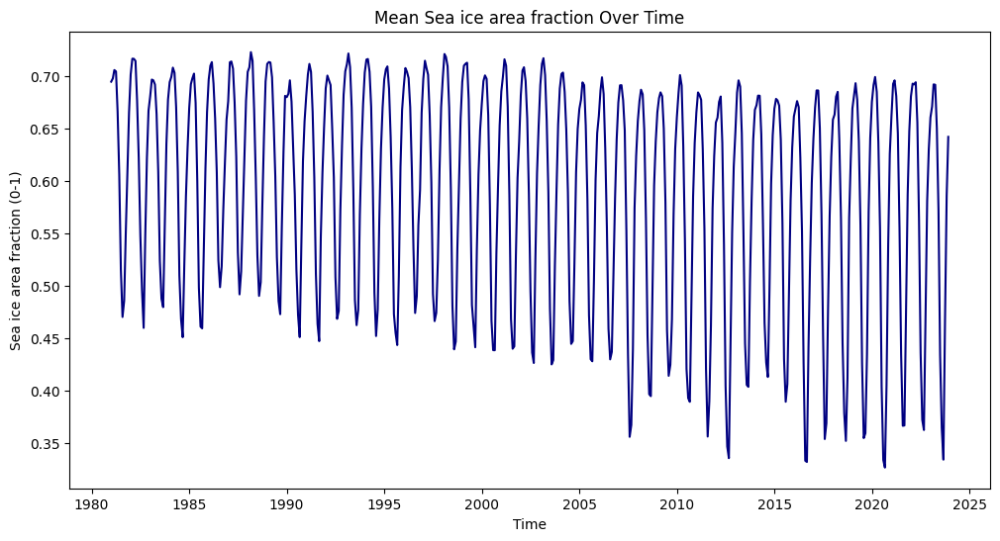

In [51]:
time, var_values = plot_timeseries(ds_ERA5,'siconc')

In [52]:
#Prepare the data for the LSTM model
X_train, X_test, y_train, y_test, scaler, train_time, test_time = prepare_data_lstm(var_values, time)

#Create Long Short Term Memory model with 100 epochs and a batch size of 16 to improve prediction accuracy but still try to prevent overfitting
model = create_lstm_model((X_train.shape[1], 1)) #input shape with number of timesteps and number of features 
model.fit(X_train, y_train, epochs=100, batch_size=16, validation_data=(X_test, y_test), verbose=1)


Epoch 1/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4948 - val_loss: 0.1712
Epoch 2/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1063 - val_loss: 0.0972
Epoch 3/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0546 - val_loss: 0.0803
Epoch 4/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0424 - val_loss: 0.0560
Epoch 5/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0222 - val_loss: 0.0226
Epoch 6/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0063 - val_loss: 0.0156
Epoch 7/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0062 - val_loss: 0.0161
Epoch 8/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0059 - val_loss: 0.0160
Epoch 9/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0052 - val_loss: 0.0134
Epoch 10/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0054 - val_loss: 0.0141
Epoch 11/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0051 - val_loss: 0.0127
Epoch 12/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0

In [53]:
#Prediction with LSTM Model
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

#Now, predictions have to be inverted before calculating errors to get same units as in the original -> see source above
y_pred_train_inv = scaler.inverse_transform(y_pred_train)
y_pred_test_inv = scaler.inverse_transform(y_pred_test)
y_train_inv = scaler.inverse_transform(y_train.reshape(-1, 1))
y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))



13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step


In [54]:
#flatten test and pred data to get a 1D array that has the same shape as time 
y_test_inv = y_test_inv.flatten()
y_pred_test_inv = y_pred_test_inv.flatten()

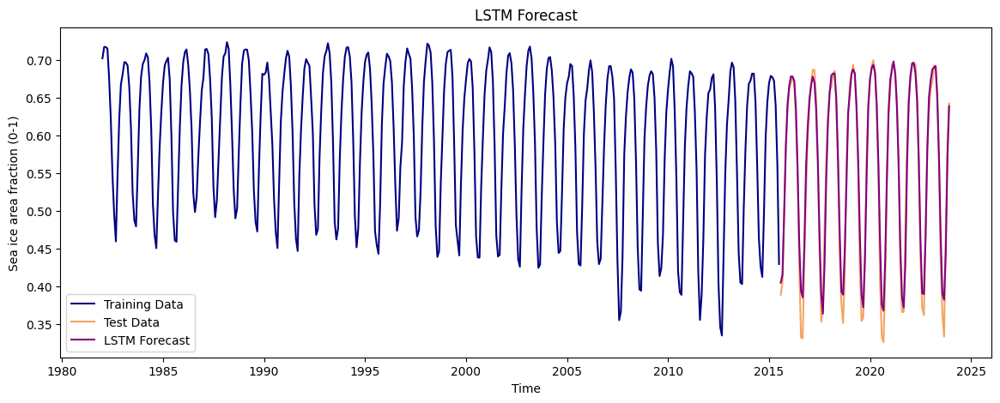

LSTM Mean Squared Error: 0.00043


In [74]:
#Plot LSTM predictions against actual values
plt.figure(figsize=(14, 5))
plt.plot(train_time, y_train_inv, label='Training Data', color='navy')
plt.plot(test_time, y_test_inv, label='Test Data', color='sandybrown')
plt.plot(test_time, y_pred_test_inv, label='LSTM Forecast', color='purple')
plt.title('LSTM Forecast')
plt.xlabel('Time')
plt.ylabel(f'{siconc.long_name} ({siconc.units})')
plt.legend()
plt.savefig('LSTM.png',format='png',dpi=150)
plt.show()

# Evaluate the model
mse_lstm = mean_squared_error(y_test_inv, y_pred_test_inv)
print(f'LSTM Mean Squared Error: {mse_lstm:.5f}')

#### EOF and PCA Analysis 

In [90]:
# https://python.nicolasbarrier.fr/misc/eof_analysis.html

In [57]:
# Open Dataset, select variables and latitudes 
z_1000_ds = xr.open_dataset('z_1000.nc')
z_1000 = z_1000_ds['z'].sel(latitude=slice(90,20))

In [58]:
#Prepare for EOF computation -> deseasonalize data
#Compute climatology for z_1000
z_1000_clim = z_1000.sel(time=slice('1979-01-01T00:00:00','2000-12-31T00:00:00')).groupby('time.month').mean(dim='time')

#Compute anomalies for z_1000
z_1000_anomaly = z_1000.groupby('time.month') - z_1000_clim

In [59]:
# Weight data properly (for EOF analysis, the square root has to be taken since it's based on covariance)
lat = z_1000_anomaly['latitude']
lon = z_1000_anomaly['longitude']
weights = area_weights(lat,lon) # use previous function to compute weights 

#negative weights are set as 0 otherwise, there would be many nan values which leads to complications later
#weights need to be 2d to multiply the weights with the data 
weights = np.sqrt(np.where(weights > 0, weights, 0))

weights_2d = np.outer(weights, np.ones_like(lon))
weights_latlon = xr.DataArray(weights_2d, coords=[lat, lon], dims=["latitude", "longitude"])

#Multiply weights with anomalies and remove the variables lat, lon and month so it has the correct shape for the Eof function
z_weighted = z_1000_anomaly * weights_latlon
z_weighted_anoms = z_weighted.drop_vars(['longitude','latitude','month'])

In [60]:
#Compute Eofs from the weighted data -> dimensionality reduction to identify the dominant variability patterns 
solver = Eof(z_weighted_anoms)

#Select number of EOFs to be analyzed -> we'll get 3 modes 
neofs = 3

#Covmaps gives the EOFs as covariance maps so the spatial patterns can be analyzed as seen below
covmaps = solver.eofsAsCovariance(neofs=neofs)

In [61]:
#The covariance maps do not have the correct coordinates so they are added manually 
covmaps_coords = xr.DataArray(
    covmaps.values,
    coords={'mode': np.arange(covmaps.shape[0]),  
            'latitude': z_1000_anomaly['latitude'],
            'longitude': z_1000_anomaly['longitude']},
    dims=['mode', 'latitude', 'longitude']
)

In [62]:
#Normalize covmaps
covmaps_coords_normalized = covmaps_coords / covmaps_coords.max(dim=['latitude', 'longitude'])

In [63]:
def plot_eof(covmap, mode):
    #Plot EOF modes as covariance maps (with covariance between -1 and 1)
    fig = plt.figure(figsize=(6,6))
    ax = plt.axes(projection=ccrs.NorthPolarStereo())
    ax.set_extent([-180,180,20,90],crs=ccrs.PlateCarree())
    
    #plot Covariance on map 
    cs = covmap[mode,:,:].plot(ax=ax, transform=ccrs.PlateCarree(), cmap= 'RdBu',cbar_kwargs={'label': 'Covariance Geopotential z at 1000 hPa (m2/s2)'})
    cs.set_clim(-1,1)
    ax.coastlines()
    ax.gridlines()
    
    #create circular image
    center, radius = [0.5, 0.5], 0.5
    circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)), np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
    ax.set_boundary(circle, transform = ax.transAxes)

    plt.title(f'EOF Mode {mode+1}')
    plt.savefig(f'EOF_{mode+1}.png',format='png',dpi=150)
    plt.show()

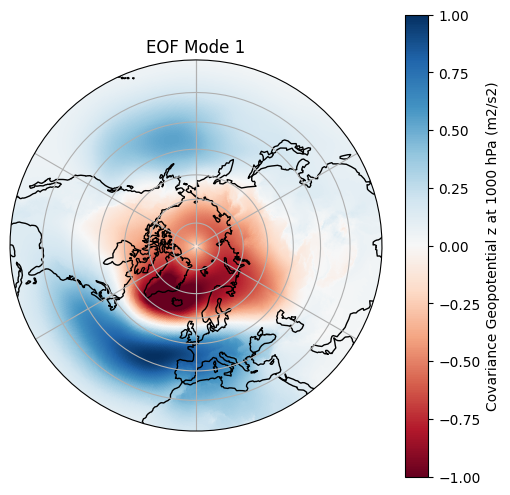

In [64]:
plot_eof(covmaps_coords_normalized, 0)

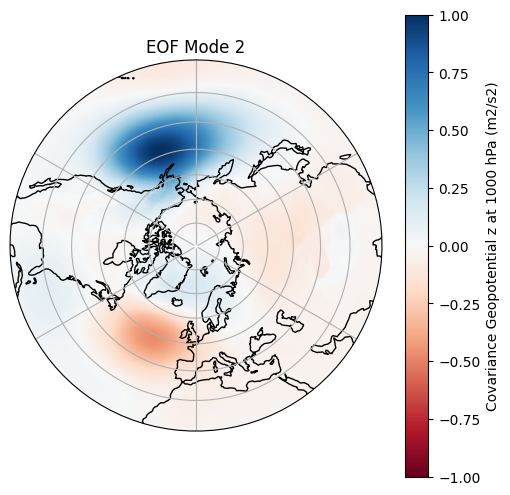

In [99]:
plot_eof(covmaps_coords_normalized, 1)

In [66]:
#Extract principle component scores of first EOF -> timeseries associated with EOF mode, with unit variance (pcscaling)
pcs = solver.pcs(pcscaling=1, npcs=1)

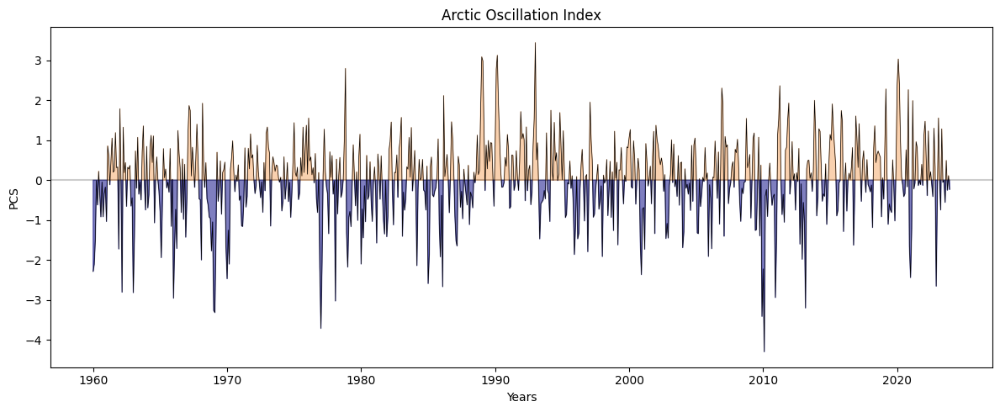

In [70]:
#Plot Principle component timeseries 

time = pcs.time.values
values = pcs.values.flatten() #values need to be 1D hence .flatten()
fig, ax = plt.subplots(figsize=(12,5))
ax.set_title('Arctic Oscillation Index')
ax.set_xlabel('Years')
ax.set_ylabel('PCS')
ax.plot(time,values,color='k',linewidth=0.5)
ax.axhline(color='k',alpha=0.2)
ax.fill_between(time, values, 0, where=(values > 0), interpolate=True, color='sandybrown', alpha=0.5)
ax.fill_between(time, values, 0, where=(values < 0), interpolate=True, color='navy', alpha=0.5)

plt.tight_layout() 
plt.savefig('PCAO.png',format='png',dpi=150)
plt.show()

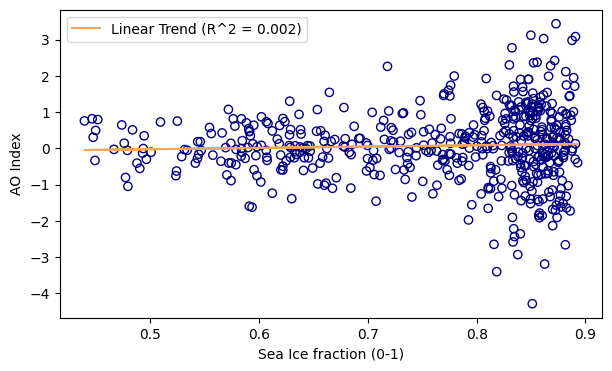

In [85]:
#Correlation between siconc and AO Index -> this is not very conclusive 

siconc_arctic = siconc.sel(latitude=slice(90,66))
pcs_sliced = pcs.sel(time=slice('1981-01-01','2023-12-01'))

slope, intercept, r, p_value, std_err = linregress(siconc_arctic.mean(dim=['longitude','latitude']),pcs_sliced.squeeze())
plt.figure(figsize=[7,4])
plt.scatter(siconc_arctic.mean(dim=['longitude','latitude']),pcs_sliced,edgecolors='navy',facecolors='none')
plt.plot(siconc_arctic.mean(dim=['longitude','latitude']),(slope*siconc_arctic.mean(dim=['longitude','latitude'])+intercept),color='sandybrown',label=f'Linear Trend (R^2 = {r**2:.3f})')
plt.xlabel('Sea Ice fraction (0-1)')
plt.ylabel('AO Index')
plt.legend()

In [97]:
#Create mask for negative ao and positive ao to plot only the sea ice fraction for values with negative AO and positive AO seperately
ao_index = pcs_sliced.squeeze(dim='mode')
negative_ao_mask = ao_index < 0
positive_ao_mask = ao_index > 0

In [99]:
siconc_negative_ao = siconc_arctic.where(negative_ao_mask, drop=True)
siconc_positive_ao = siconc_arctic.where(positive_ao_mask, drop=True)

In [103]:
ao_index_negative_ao = ao_index.where(negative_ao_mask, drop=True)
ao_index_positive_ao = ao_index.where(positive_ao_mask, drop=True)


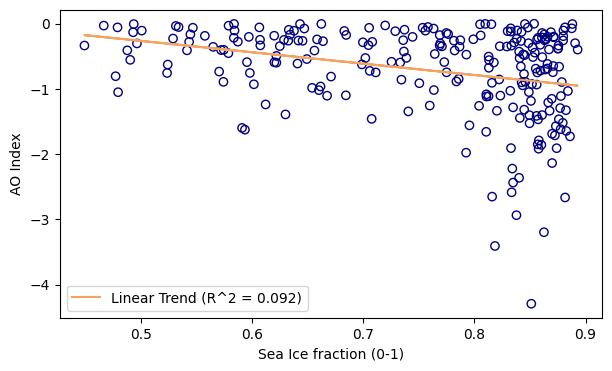

In [112]:
slope, intercept, r, p_value, std_err = linregress(siconc_negative_ao.mean(dim=['latitude','longitude']), ao_index_negative_ao)

plt.figure(figsize=[7,4])
plt.scatter(siconc_negative_ao.mean(dim=['latitude','longitude']), ao_index_negative_ao ,edgecolors='navy',facecolors='none')
plt.plot(siconc_negative_ao.mean(dim=['longitude','latitude']),(slope*siconc_negative_ao.mean(dim=['longitude','latitude'])+intercept),color='sandybrown',label=f'Linear Trend (R^2 = {r**2:.3f})')
plt.xlabel('Sea Ice fraction (0-1)')
plt.ylabel('AO Index')
plt.legend()

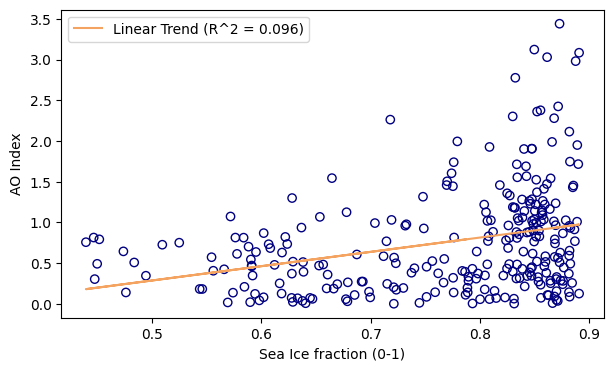

In [114]:
slope, intercept, r, p_value, std_err = linregress(siconc_positive_ao.mean(dim=['latitude','longitude']), ao_index_positive_ao)

plt.figure(figsize=[7,4])
plt.scatter(siconc_positive_ao.mean(dim=['latitude','longitude']), ao_index_positive_ao ,edgecolors='navy',facecolors='none')
plt.plot(siconc_positive_ao.mean(dim=['longitude','latitude']),(slope*siconc_positive_ao.mean(dim=['longitude','latitude'])+intercept),color='sandybrown',label=f'Linear Trend (R^2 = {r**2:.3f})')
plt.xlabel('Sea Ice fraction (0-1)')
plt.ylabel('AO Index')
plt.legend()